In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from itertools import chain
from IPython.display import Image, display

##Import any other packages you may need here

EDA is open-ended, and it is up to you to decide how to look at different ways to slice and dice your data. A good starting point is to look at the requirements for the FDA documentation in the final part of this project to guide (some) of the analyses you do. 

This EDA should also help to inform you of how pneumonia looks in the wild. E.g. what other types of diseases it's commonly found with, how often it is found, what ages it affects, etc. 

Note that this NIH dataset was not specifically acquired for pneumonia. So, while this is a representation of 'pneumonia in the wild,' the prevalence of pneumonia may be different if you were to take only chest x-rays that were acquired in an ER setting with suspicion of pneumonia. 

Perform the following EDA:
* The patient demographic data such as gender, age, patient position,etc. (as it is available)
* The x-ray views taken (i.e. view position)
* The number of cases including: 
    * number of pneumonia cases,
    * number of non-pneumonia cases
* The distribution of other diseases that are comorbid with pneumonia
* Number of disease per patient 
* Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases.

Note: use full NIH data to perform the first a few EDA items and use `sample_labels.csv` for the pixel-level assassements. 

Also, **describe your findings and how will you set up the model training based on the findings.**

In [2]:
## Below is some helper code to read data for you.
## Load NIH data
data = pd.read_csv('/data/Data_Entry_2017.csv')
data.sample(3)

## Load 'sample_labels.csv' data for pixel level assessments
sample = pd.read_csv('sample_labels.csv')
sample.sample(3)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
2095,00010805_018.png,Consolidation|Effusion,18,10805,007Y,F,AP,2500,2048,0.168,0.168
2441,00012273_001.png,Atelectasis|Effusion|Infiltration,1,12273,061Y,M,PA,2992,2991,0.143,0.143
664,00003426_034.png,Atelectasis|Effusion|Infiltration,34,3426,060Y,M,PA,2500,2048,0.168,0.168


In [3]:
sample.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,0.139
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,0.168
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,0.143
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168


In [4]:
## EDA
# Todo
data.describe()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,0.0
mean,8.573751,14346.381743,46.901463,2646.078844,2486.438842,0.155649,0.155649,NaN
std,15.406320,8403.876972,16.839923,341.246429,401.268227,0.016174,0.016174,NaN
min,0.000000,1.000000,1.000000,1143.000000,966.000000,0.115000,0.115000,NaN
25%,0.000000,7310.750000,35.000000,2500.000000,2048.000000,0.143000,0.143000,NaN
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000,NaN
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000,NaN
max,183.000000,30805.000000,414.000000,3827.000000,4715.000000,0.198800,0.198800,NaN


In [5]:
data[data['Finding Labels']=='Pneumonia'].count()

Image Index                    322
Finding Labels                 322
Follow-up #                    322
Patient ID                     322
Patient Age                    322
Patient Gender                 322
View Position                  322
OriginalImage[Width            322
Height]                        322
OriginalImagePixelSpacing[x    322
y]                             322
Unnamed: 11                      0
dtype: int64

We see that the average of patients is 47. We also have some information about the boundry boxes. The maximum age seems to be a mistake.

(array([21., 19., 49., 40., 48., 55., 40., 34., 10.,  6.]),
 array([ 3. , 11.4, 19.8, 28.2, 36.6, 45. , 53.4, 61.8, 70.2, 78.6, 87. ]),
 <a list of 10 Patch objects>)

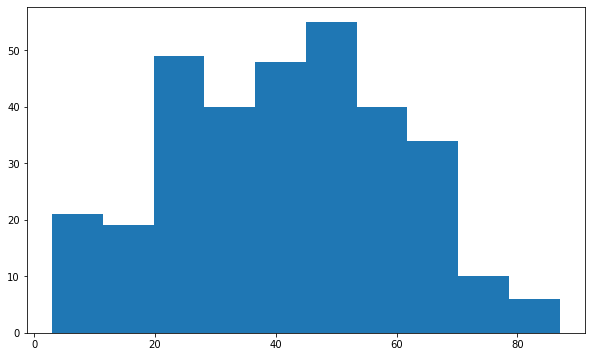

In [6]:
plt.figure(figsize=(10,6))
plt.hist(data[data['Finding Labels']=='Pneumonia']['Patient Age'])

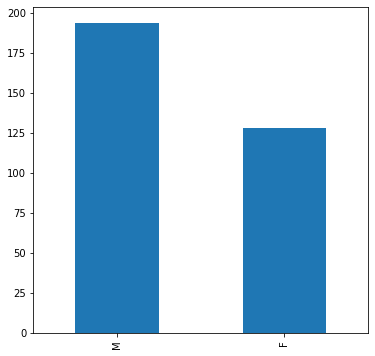

In [7]:
plt.figure(figsize=(6,6))
data[data['Finding Labels']=='Pneumonia']['Patient Gender'].value_counts().plot(kind='bar')

In [8]:
#dropping unsued columns and rows where the data does not make sense(for example patients maximum age cannot be 414)
data = data[data['Patient Age']<100]

#### Viewing images from the Sample file

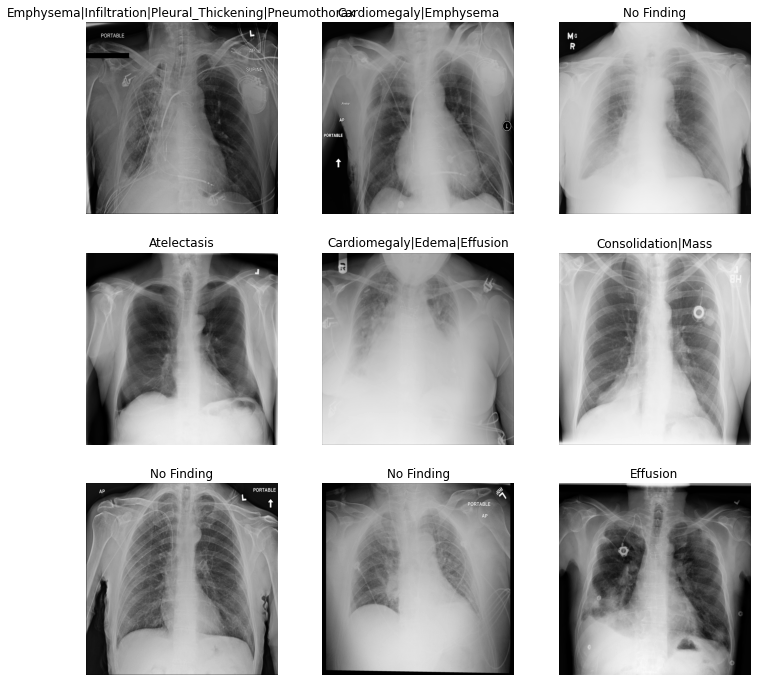

In [9]:
img_paths = [glob(f"/data/images*/*/{i}")[0] for i in sample['Image Index'].values]
_,axs = plt.subplots(3,3,figsize=(12,12))
axs = axs.flatten()
for img_path, ax in zip(img_paths,axs):
    img = plt.imread(img_path)
    ax.set_title(sample[sample['Image Index']==img_path.split('/')[-1]]['Finding Labels'].values[0])
    ax.axis('Off')
    ax.imshow(img, cmap = 'gray')
    
plt.show()    

In [10]:
## Now I will split the "Finding Labels" column so that I have one column in my dataframe
# per disease, with a binary flag. To make EDA easier 

all_labels = np.unique(list(chain(*data['Finding Labels'].map(lambda x: x.split('|')).tolist())))
all_labels = [x for x in all_labels if len(x)>0]
print('All Labels ({}): {}'.format(len(all_labels), all_labels))
for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        data[c_label] = data['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)
data.sample(3)

All Labels (15): ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'No Finding', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
53921,00013608_002.png,Consolidation|Effusion,2,13608,16,M,AP,2500,2048,0.168,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
96625,00025454_014.png,No Finding,14,25454,53,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
59759,00014751_003.png,Consolidation|Infiltration|Mass,3,14751,55,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [11]:
#Lets find out the length of the data we have
data.shape

(112104, 27)

In [12]:
#The number of Pneumonia cases
data[data['Pneumonia']==1].count()

Image Index                    1430
Finding Labels                 1430
Follow-up #                    1430
Patient ID                     1430
Patient Age                    1430
Patient Gender                 1430
View Position                  1430
OriginalImage[Width            1430
Height]                        1430
OriginalImagePixelSpacing[x    1430
y]                             1430
Unnamed: 11                       0
Atelectasis                    1430
Cardiomegaly                   1430
Consolidation                  1430
Edema                          1430
Effusion                       1430
Emphysema                      1430
Fibrosis                       1430
Hernia                         1430
Infiltration                   1430
Mass                           1430
No Finding                     1430
Nodule                         1430
Pleural_Thickening             1430
Pneumonia                      1430
Pneumothorax                   1430
dtype: int64

In [13]:
#The number of non Pneumonia cases
data[data['Pneumonia']==0].count()

Image Index                    110674
Finding Labels                 110674
Follow-up #                    110674
Patient ID                     110674
Patient Age                    110674
Patient Gender                 110674
View Position                  110674
OriginalImage[Width            110674
Height]                        110674
OriginalImagePixelSpacing[x    110674
y]                             110674
Unnamed: 11                         0
Atelectasis                    110674
Cardiomegaly                   110674
Consolidation                  110674
Edema                          110674
Effusion                       110674
Emphysema                      110674
Fibrosis                       110674
Hernia                         110674
Infiltration                   110674
Mass                           110674
No Finding                     110674
Nodule                         110674
Pleural_Thickening             110674
Pneumonia                      110674
Pneumothorax

In [14]:
data['Finding Labels']

0                   Cardiomegaly
1         Cardiomegaly|Emphysema
2          Cardiomegaly|Effusion
3                     No Finding
4                         Hernia
                   ...          
112115            Mass|Pneumonia
112116                No Finding
112117                No Finding
112118                No Finding
112119                No Finding
Name: Finding Labels, Length: 112104, dtype: object

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112104 entries, 0 to 112119
Data columns (total 27 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112104 non-null  object 
 1   Finding Labels               112104 non-null  object 
 2   Follow-up #                  112104 non-null  int64  
 3   Patient ID                   112104 non-null  int64  
 4   Patient Age                  112104 non-null  int64  
 5   Patient Gender               112104 non-null  object 
 6   View Position                112104 non-null  object 
 7   OriginalImage[Width          112104 non-null  int64  
 8   Height]                      112104 non-null  int64  
 9   OriginalImagePixelSpacing[x  112104 non-null  float64
 10  y]                           112104 non-null  float64
 11  Unnamed: 11                  0 non-null       float64
 12  Atelectasis                  112104 non-null  float64
 13 

In [2]:
data['ViewPosition']

NameError: name 'data' is not defined

We see that there are no null values

Let's plot a bar graph showing the number of patients affected by every disease

[Text(0, 0.5, 'Number of Images with Label')]

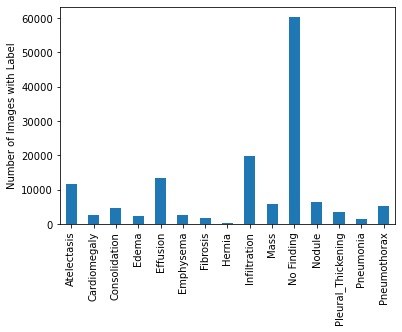

In [16]:
ax = data[all_labels].sum().plot(kind='bar')
ax.set(ylabel = 'Number of Images with Label')

This shows that No finding is most common which means there are around 60000 rows with no disease. Similarly the next highest bar is of infiltration with around 22000 people being infected by it followed by effusion and Atelectasis.

In [17]:
len(data)

112104

In [18]:
sum(data["Pneumonia"])/len(data)

0.012756012274316705

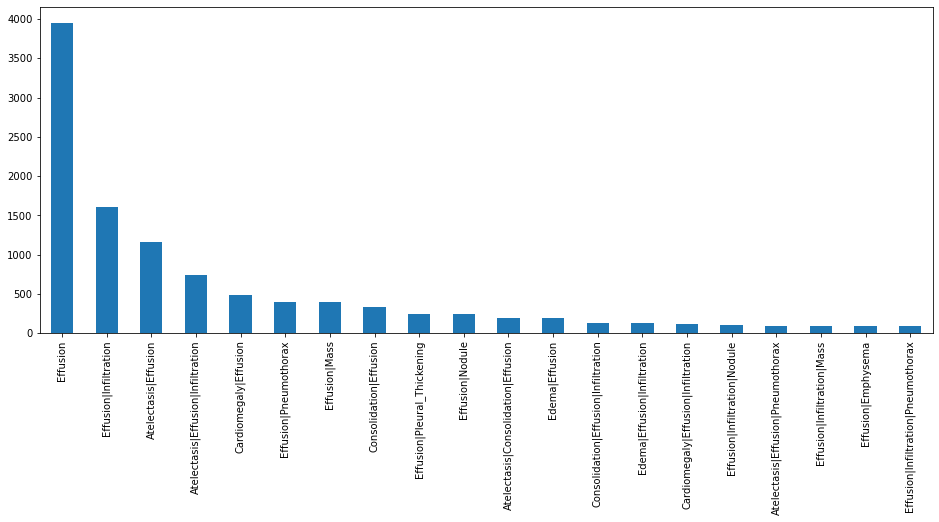

In [19]:
##Since there are many combinations of potential findings, I'm going to look at the 20 most common co-occurrences:
plt.figure(figsize=(16,6))
data[data.Effusion==1]['Finding Labels'].value_counts()[0:20].plot(kind='bar')

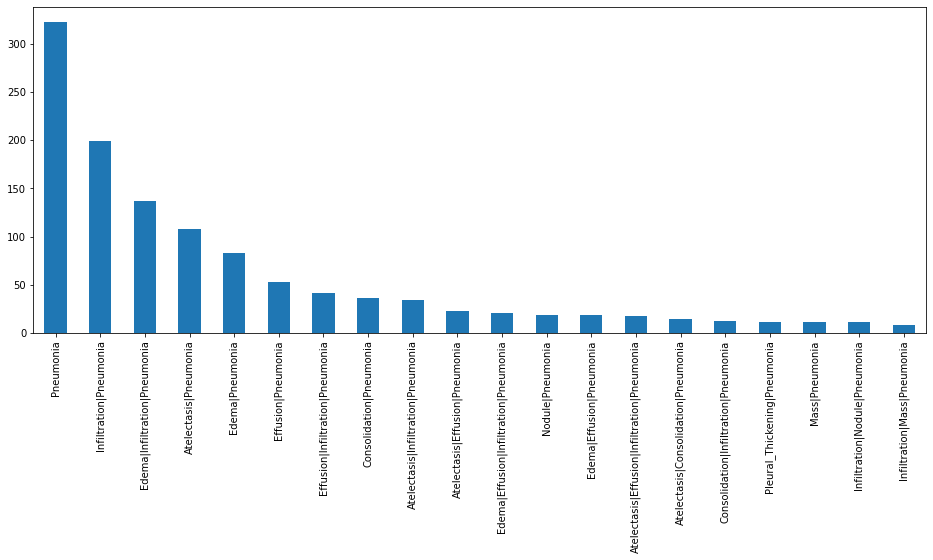

In [20]:
plt.figure(figsize=(16,6))
data[data.Pneumonia==1]['Finding Labels'].value_counts()[0:20].plot(kind='bar')

Now, lets plot the age distribution of the patients using histogram.

(array([ 1803.,  5021., 12798., 14580., 18664., 26481., 20790.,  9793.,
         1917.,   257.]),
 array([ 1. , 10.4, 19.8, 29.2, 38.6, 48. , 57.4, 66.8, 76.2, 85.6, 95. ]),
 <a list of 10 Patch objects>)

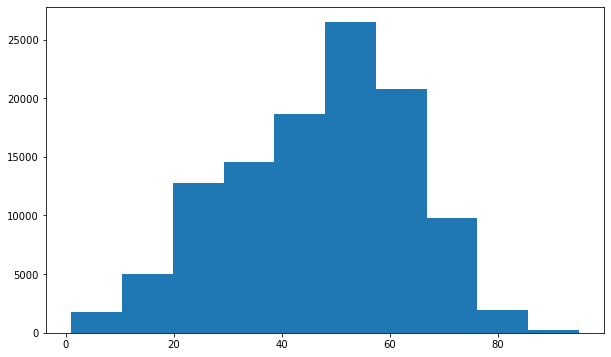

In [21]:
plt.figure(figsize=(10,6))
plt.hist(data['Patient Age'])

This shows that most of our patients are in the age group of 45-60

(array([67299.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 44805.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

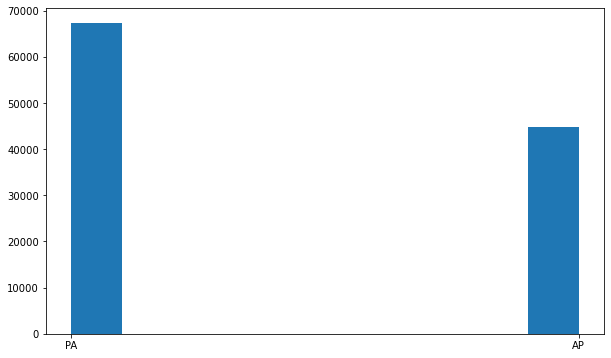

In [22]:
plt.figure(figsize=(10,6))
plt.hist(data['View Position'])

(array([63328.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 48776.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

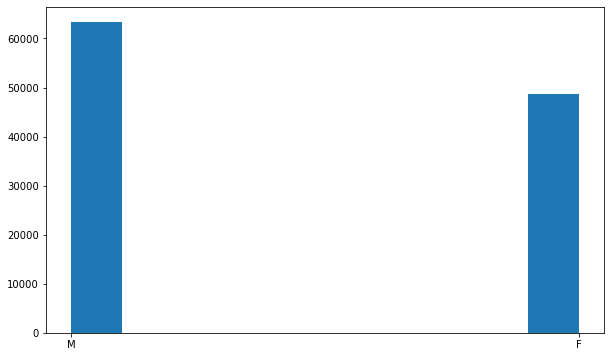

In [23]:
plt.figure(figsize=(10,6))
plt.hist(data['Patient Gender'])

This shows that though the distribution is not very skewed. There are more males in the dataset than females

(array([ 41.,  85., 174., 203., 196., 243., 266., 175.,  39.,   8.]),
 array([ 2. , 10.8, 19.6, 28.4, 37.2, 46. , 54.8, 63.6, 72.4, 81.2, 90. ]),
 <a list of 10 Patch objects>)

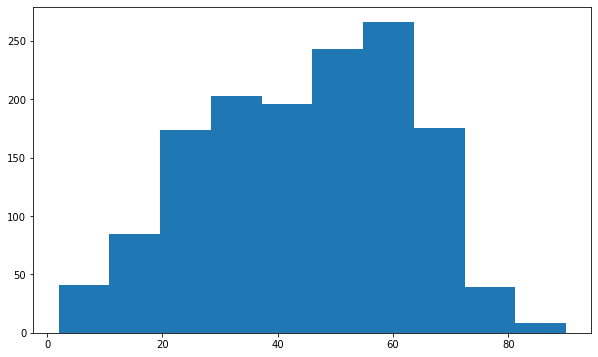

In [24]:
plt.figure(figsize=(10,6))
plt.hist(data[data.Pneumonia==1]['Patient Age'])

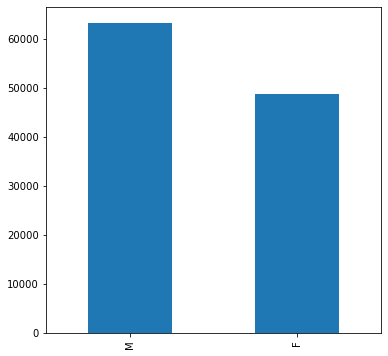

In [25]:
plt.figure(figsize=(6,6))
data['Patient Gender'].value_counts().plot(kind='bar')

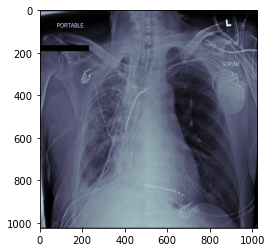

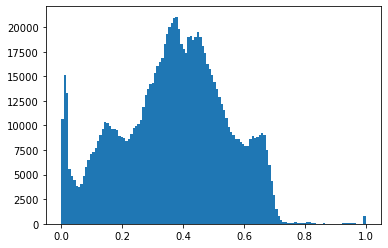

In [26]:
data_sample_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/data','images*', '*', '*.png'))}
sample["path"] = sample["Image Index"].map(data_sample_paths.get)

#Pneumonia Case
#Visualizing the Image
sample_imageP1 = plt.imread('/data/images_001/images/00000013_005.png')

plt.imshow(sample_imageP1,cmap='bone')

## Intensity distribution
fig = plt.figure()
plt.hist(sample_imageP1.flatten(), bins = 128)
plt.show()

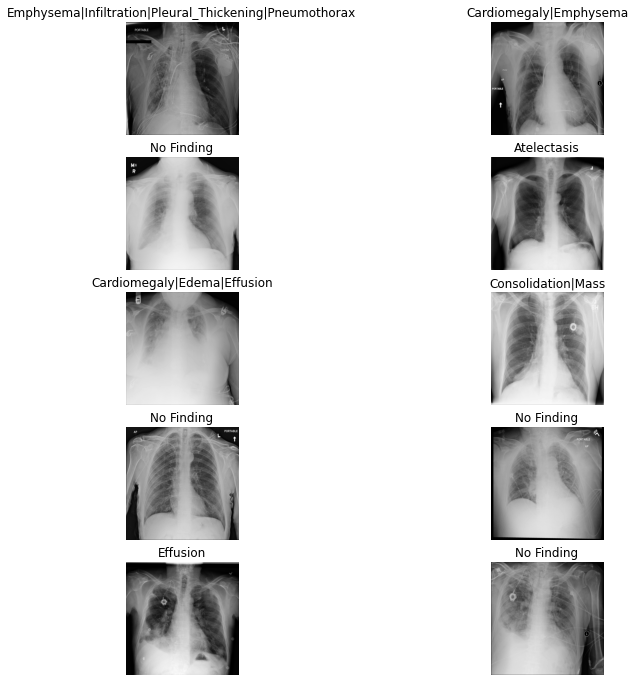

In [27]:
data_sample_paths = {os.path.basename(x): x for x in 
                   glob(os.path.join('/data','images*', '*', '*.png'))}
_,axs = plt.subplots(5,2,figsize=(12,12))
sample["path"] = sample["Image Index"].map(data_sample_paths.get)
axs = axs.flatten()
for img_path, ax in zip(sample["path"],axs):
    img = plt.imread(img_path)
    ax.set_title(sample[sample['Image Index']==img_path.split('/')[-1]]['Finding Labels'].values[0])
    ax.axis('Off')
    ax.imshow(img, cmap = 'gray')
    
plt.show()   

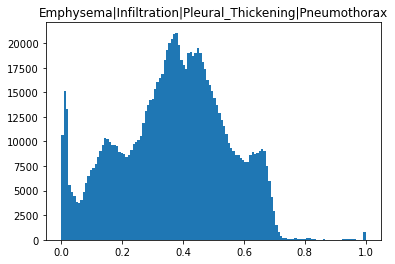

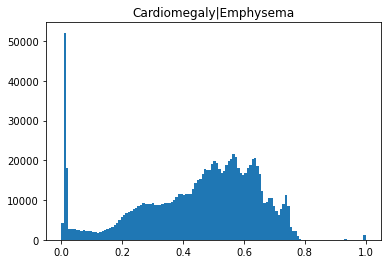

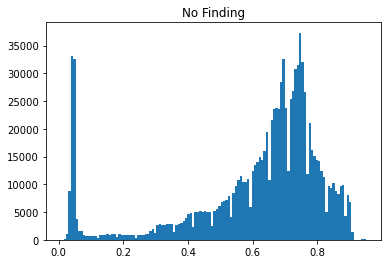

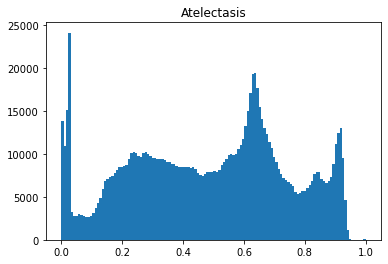

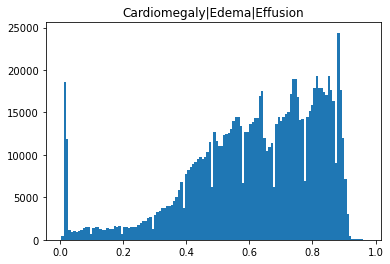

...

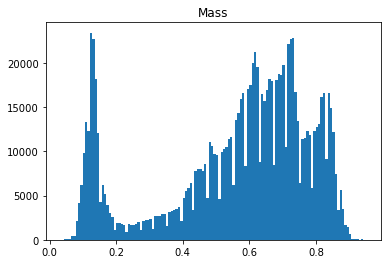

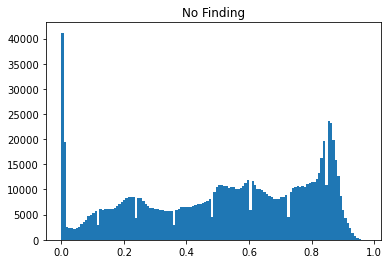

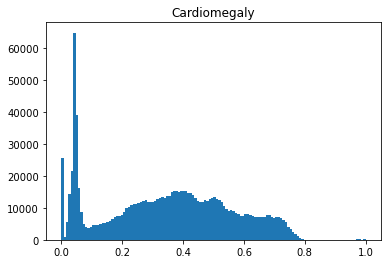

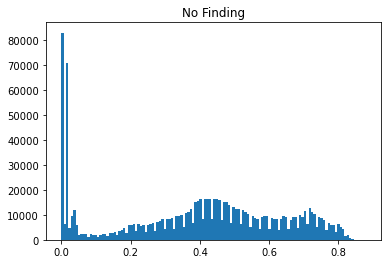

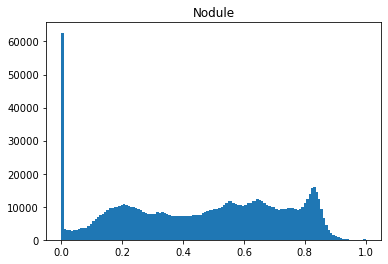

In [ ]:
for img_path in sample["path"]:
    img = plt.imread(img_path)
    fig = plt.figure()
    plt.hist(img.flatten(), bins = 128)
    plt.title(sample[sample['Image Index']==img_path.split('/')[-1]]['Finding Labels'].values[0])
    plt.show()
    
 

Intensity level values of pixel data within the images:
It can be observed that most of the images have peak intensities in between 0.7 - 0.9


In [ ]:
#Non Pneumonia Case
#Visualizing the Image
sample_image = plt.imread('/data/images_001/images/00000017_001.png')

plt.imshow(sample_image,cmap='bone')

## Intensity distribution
fig = plt.figure()
plt.hist(sample_image.flatten(), bins = 128)
plt.show()

We notice that the intensity level for a normal case is maximum in at around 0.7 whereas for that of Pneumonia case peaks at around 0.3